# Version

* `v2`: hyp.finetune.yaml fold4

In [1]:
# !pip install --upgrade seaborn

In [2]:
import numpy as np, pandas as pd
from glob import glob
import shutil, os
import matplotlib.pyplot as plt
from sklearn.model_selection import GroupKFold
from tqdm.notebook import tqdm
import seaborn as sns

In [3]:
dim = 1024 #512, 256, 'original'
fold = 3

In [4]:
train_df = pd.read_csv(f'./input/vinbigdata-{dim}x{dim}/train.csv')
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN,2332,2580
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN,2954,3159
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,2080,2336
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0,2304,2880
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN,2540,3072


In [5]:
train_df['image_path'] = f'./input/vinbigdata-{dim}x{dim}/train/'+train_df.image_id+('.png' if dim!='original' else '.jpg')
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,image_path
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN,2332,2580,./input/vinbigdata-1024x1024/train/50a418190bc...
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN,2954,3159,./input/vinbigdata-1024x1024/train/21a10246a5e...
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,2080,2336,./input/vinbigdata-1024x1024/train/9a5094b2563...
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0,2304,2880,./input/vinbigdata-1024x1024/train/051132a778e...
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN,2540,3072,./input/vinbigdata-1024x1024/train/063319de25c...


# Only 14 Class

In [6]:
train_df = train_df[train_df.class_id!=14].reset_index(drop = True)

# Pre-Processing

In [7]:
train_df['x_min'] = train_df.apply(lambda row: (row.x_min)/row.width, axis =1)
train_df['y_min'] = train_df.apply(lambda row: (row.y_min)/row.height, axis =1)

train_df['x_max'] = train_df.apply(lambda row: (row.x_max)/row.width, axis =1)
train_df['y_max'] = train_df.apply(lambda row: (row.y_max)/row.height, axis =1)

train_df['x_mid'] = train_df.apply(lambda row: (row.x_max+row.x_min)/2, axis =1)
train_df['y_mid'] = train_df.apply(lambda row: (row.y_max+row.y_min)/2, axis =1)

train_df['w'] = train_df.apply(lambda row: (row.x_max-row.x_min), axis =1)
train_df['h'] = train_df.apply(lambda row: (row.y_max-row.y_min), axis =1)

train_df['area'] = train_df['w']*train_df['h']
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,image_path,x_mid,y_mid,w,h,area
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,0.332212,0.588613,0.794712,0.783818,2080,2336,./input/vinbigdata-1024x1024/train/9a5094b2563...,0.563462,0.686216,0.462500,0.195205,0.090283
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,0.548611,0.257986,0.699219,0.353819,2304,2880,./input/vinbigdata-1024x1024/train/051132a778e...,0.623915,0.305903,0.150608,0.095833,0.014433
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,0.246850,0.116211,0.372835,0.140951,2540,3072,./input/vinbigdata-1024x1024/train/1c32170b4af...,0.309843,0.128581,0.125984,0.024740,0.003117
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,0.589497,0.095890,0.957549,0.848924,2285,2555,./input/vinbigdata-1024x1024/train/0c7a38f293d...,0.773523,0.472407,0.368053,0.753033,0.277156
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,0.216900,0.701461,0.262850,0.740829,2568,3353,./input/vinbigdata-1024x1024/train/47ed17dcb2c...,0.239875,0.721145,0.045950,0.039368,0.001809


In [8]:
features = ['x_min', 'y_min', 'x_max', 'y_max', 'x_mid', 'y_mid', 'w', 'h', 'area']
X = train_df[features]
y = train_df['class_id']
X.shape, y.shape

((36096, 9), (36096,))

In [9]:
class_ids, class_names = list(zip(*set(zip(train_df.class_id, train_df.class_name))))
classes = list(np.array(class_names)[np.argsort(class_ids)])
classes = list(map(lambda x: str(x), classes))
classes

['Aortic enlargement',
 'Atelectasis',
 'Calcification',
 'Cardiomegaly',
 'Consolidation',
 'ILD',
 'Infiltration',
 'Lung Opacity',
 'Nodule/Mass',
 'Other lesion',
 'Pleural effusion',
 'Pleural thickening',
 'Pneumothorax',
 'Pulmonary fibrosis']

# t-SNE Visualization

In [10]:
# %%time
# from sklearn.manifold import TSNE

# tsne = TSNE(n_components = 2, perplexity = 40, random_state=1, n_iter=5000)
# data_X = X
# data_y = y.loc[data_X.index]
# embs = tsne.fit_transform(data_X)
# # Add to dataframe for convenience
# plot_x = embs[:, 0]
# plot_y = embs[:, 1]

In [11]:
# import matplotlib.pyplot as plt
# plt.figure(figsize = (15, 15))
# plt.axis('off')
# scatter = plt.scatter(plot_x, plot_y, marker = 'o',s = 50, c=data_y.tolist(), alpha= 0.5,cmap='viridis')
# plt.legend(handles=scatter.legend_elements()[0], labels=classes)

# BBox Location

## x_mid Vs y_mid

In [12]:
# from scipy.stats import gaussian_kde


# x_val = train_df.x_mid.values
# y_val = train_df.y_mid.values

# # Calculate the point density
# xy = np.vstack([x_val,y_val])
# z = gaussian_kde(xy)(xy)

# fig, ax = plt.subplots(figsize = (10, 10))
# ax.axis('off')
# ax.scatter(x_val, y_val, c=z, s=100, cmap='viridis')
# # ax.set_xlabel('x_mid')
# # ax.set_ylabel('y_mid')
# plt.show()

## bbox_w Vs bbox_h

In [13]:
# x_val = train_df.w.values
# y_val = train_df.h.values

# # Calculate the point density
# xy = np.vstack([x_val,y_val])
# z = gaussian_kde(xy)(xy)

# fig, ax = plt.subplots(figsize = (10, 10))
# ax.axis('off')
# ax.scatter(x_val, y_val, c=z, s=100, cmap='viridis')
# # ax.set_xlabel('bbox_width')
# # ax.set_ylabel('bbox_height')
# plt.show()

# Image Aspect Ratio

In [14]:
# x_val = train_df.width.values
# y_val = train_df.height.values

# # Calculate the point density
# xy = np.vstack([x_val,y_val])
# z = gaussian_kde(xy)(xy)

# fig, ax = plt.subplots(figsize = (10, 10))
# ax.axis('off')
# ax.scatter(x_val, y_val, c=z, s=100, cmap='viridis')
# # ax.set_xlabel('image_width')
# # ax.set_ylabel('image_height')
# plt.show()

# Split

In [15]:
gkf  = GroupKFold(n_splits = 5)
train_df['fold'] = -1
for fold, (train_idx, val_idx) in enumerate(gkf.split(train_df, groups = train_df.image_id.tolist())):
    train_df.loc[val_idx, 'fold'] = fold
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,image_path,x_mid,y_mid,w,h,area,fold
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,0.332212,0.588613,0.794712,0.783818,2080,2336,./input/vinbigdata-1024x1024/train/9a5094b2563...,0.563462,0.686216,0.462500,0.195205,0.090283,3
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,0.548611,0.257986,0.699219,0.353819,2304,2880,./input/vinbigdata-1024x1024/train/051132a778e...,0.623915,0.305903,0.150608,0.095833,0.014433,2
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,0.246850,0.116211,0.372835,0.140951,2540,3072,./input/vinbigdata-1024x1024/train/1c32170b4af...,0.309843,0.128581,0.125984,0.024740,0.003117,4
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,0.589497,0.095890,0.957549,0.848924,2285,2555,./input/vinbigdata-1024x1024/train/0c7a38f293d...,0.773523,0.472407,0.368053,0.753033,0.277156,2
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,0.216900,0.701461,0.262850,0.740829,2568,3353,./input/vinbigdata-1024x1024/train/47ed17dcb2c...,0.239875,0.721145,0.045950,0.039368,0.001809,4


In [16]:
fold = 3
train_files = []
val_files   = []
val_files += list(train_df[train_df.fold==fold].image_path.unique())
train_files += list(train_df[train_df.fold!=fold].image_path.unique())
len(train_files), len(val_files)

(3516, 878)

In [17]:
print(train_files[:5])

['./input/vinbigdata-1024x1024/train/051132a778e61a86eb147c7c6f564dfe.png', './input/vinbigdata-1024x1024/train/1c32170b4af4ce1a3030eb8167753b06.png', './input/vinbigdata-1024x1024/train/0c7a38f293d5f5e4846aa4ca6db4daf1.png', './input/vinbigdata-1024x1024/train/47ed17dcb2cbeec15182ed335a8b5a9e.png', './input/vinbigdata-1024x1024/train/afb6230703512afc370f236e8fe98806.png']


# Copying Files

In [18]:
os.makedirs('/root/working/vinbigdata/labels/train', exist_ok = True)
os.makedirs('/root/working/vinbigdata/labels/val', exist_ok = True)
os.makedirs('/root/working/vinbigdata/images/train', exist_ok = True)
os.makedirs('/root/working/vinbigdata/images/val', exist_ok = True)
label_dir = '/root/input/vinbigdata-yolo-labels-dataset/labels'
ensemble_label_dir = '/root/input/VinDr-Bounding-Box-Fusion/labels'
for file in tqdm(train_files):
    shutil.copy(file, '/root/working/vinbigdata/images/train')
    filename = file.split('/')[-1].split('.')[0]
    shutil.copy(os.path.join(ensemble_label_dir, filename+'.txt'), '/root/working/vinbigdata/labels/train')
    
for file in tqdm(val_files):
    shutil.copy(file, '/root/working/vinbigdata/images/val')
    filename = file.split('/')[-1].split('.')[0]
    shutil.copy(os.path.join(ensemble_label_dir, filename+'.txt'), './working/vinbigdata/labels/val')

  0%|          | 0/3516 [00:00<?, ?it/s]

  0%|          | 0/878 [00:00<?, ?it/s]

In [19]:
for filename in os.listdir('/root/working/vinbigdata/images/train/'):
    if '051132a778e61a86eb147c7c6f564dfe' in filename:
        print(filename)

051132a778e61a86eb147c7c6f564dfe.png


In [20]:
for filename in os.listdir('/root/working/vinbigdata/images/val/'):
    print(filename)

9a5094b2563a1ef3ff50dc5c7ff71345.png
d3637a1935a905b3c326af31389cb846.png
f32ab457c492c30221d3a89fe7c6b25a.png
6900482a91a538ead56b483f77bcf289.png
0a14aeaf02d42990d8bb5d55270b7274.png
d77ef79ee4580a65dcb1e0e26b91d017.png
9598f874069cca35ff56d54925d35ccb.png
def03f80d3b78a52a6f9af13565343ff.png
d07557904cbe57fc1bdebac1e8aeefa1.png
c5c36ce7f8adbd045bfe59a325eeae47.png
231a4b73de5ac7e0218f736b6b6ff1f2.png
604340ab6423f81a91ac72182163e9a4.png
bdd0bebed953f69413213d387c9717e7.png
89e6ab133f587191383608ee04cea79a.png
4b56bc6d22b192f075f13231419dfcc8.png
5156d69e540648eb952371ec5c80bc81.png
1c1ef26e3b3323f74041f6dd2371cd24.png
b770403a1d0ab861f1944f8b896afcae.png
aa1ebd488f7f3cab0aa784073b0a9d70.png
d61eb45d47ad48020286203b1f1362f8.png
0a411e44ec67f3d5d80a5b3d5a3edca3.png
3a302fbbbf3364aa1a7731b59e6b98ec.png
c5010a72f3e20e9b59d7bb991d3c633b.png
a824f7f43552c3af8d846dd1cc0f0c11.png
352ab0683046ce107942e9e477007b72.png
8acbe4fb1e5a886042029febc6700af2.png
c70dce909198abf8b39a7e0d41c9a895.png
2

In [21]:
train_df[train_df['image_id']=='1c32170b4af4ce1a3030eb8167753b06']

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,image_path,x_mid,y_mid,w,h,area,fold
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,0.246850,0.116211,0.372835,0.140951,2540,3072,./input/vinbigdata-1024x1024/train/1c32170b4af...,0.309843,0.128581,0.125984,0.024740,0.003117,4
1424,1c32170b4af4ce1a3030eb8167753b06,Pulmonary fibrosis,13,R9,0.201181,0.165365,0.374016,0.248047,2540,3072,./input/vinbigdata-1024x1024/train/1c32170b4af...,0.287598,0.206706,0.172835,0.082682,0.014290,4
2978,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,0.700787,0.117513,0.805906,0.199219,2540,3072,./input/vinbigdata-1024x1024/train/1c32170b4af...,0.753346,0.158366,0.105118,0.081706,0.008589,4
8384,1c32170b4af4ce1a3030eb8167753b06,Pulmonary fibrosis,13,R9,0.705906,0.246419,0.776378,0.298503,2540,3072,./input/vinbigdata-1024x1024/train/1c32170b4af...,0.741142,0.272461,0.070472,0.052083,0.003670,4
11473,1c32170b4af4ce1a3030eb8167753b06,Pulmonary fibrosis,13,R8,0.662992,0.146484,0.754331,0.240560,2540,3072,./input/vinbigdata-1024x1024/train/1c32170b4af...,0.708661,0.193522,0.091339,0.094076,0.008593,4
25222,1c32170b4af4ce1a3030eb8167753b06,Pulmonary fibrosis,13,R8,0.216142,0.148438,0.358268,0.260742,2540,3072,./input/vinbigdata-1024x1024/train/1c32170b4af...,0.287205,0.204590,0.142126,0.112305,0.015961,4
29272,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R10,0.730709,0.134115,0.805118,0.191081,2540,3072,./input/vinbigdata-1024x1024/train/1c32170b4af...,0.767913,0.162598,0.074409,0.056966,0.004239,4
32822,1c32170b4af4ce1a3030eb8167753b06,Pulmonary fibrosis,13,R10,0.208268,0.143229,0.303543,0.241211,2540,3072,./input/vinbigdata-1024x1024/train/1c32170b4af...,0.255906,0.192220,0.095276,0.097982,0.009335,4
34669,1c32170b4af4ce1a3030eb8167753b06,Pulmonary fibrosis,13,R9,0.682677,0.177409,0.742913,0.243164,2540,3072,./input/vinbigdata-1024x1024/train/1c32170b4af...,0.712795,0.210286,0.060236,0.065755,0.003961,4


(1024, 1024)


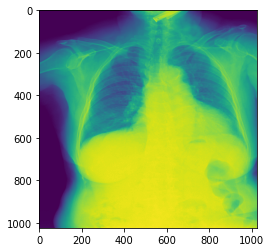

'0 0.6278935670852661 0.30983798205852503 0.143518567085266 0.10972222685813895 \n3 0.6505353152751923 0.5170138776302338 0.4729456305503845 0.12777775526046753 \n11 0.7369791666666666 0.18333333333333332 0.0920138888888889 0.05277777777777778 \n'

In [22]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

img = mpimg.imread('/root/working/vinbigdata/images/train/051132a778e61a86eb147c7c6f564dfe.png')
print(img.shape)
plt.imshow(img)
plt.show()

f = open('/root/working/vinbigdata/labels/train/051132a778e61a86eb147c7c6f564dfe.txt', 'r')
f.read()


# Get Class Name

In [23]:
class_ids, class_names = list(zip(*set(zip(train_df.class_id, train_df.class_name))))
classes = list(np.array(class_names)[np.argsort(class_ids)])
classes = list(map(lambda x: str(x), classes))
classes

['Aortic enlargement',
 'Atelectasis',
 'Calcification',
 'Cardiomegaly',
 'Consolidation',
 'ILD',
 'Infiltration',
 'Lung Opacity',
 'Nodule/Mass',
 'Other lesion',
 'Pleural effusion',
 'Pleural thickening',
 'Pneumothorax',
 'Pulmonary fibrosis']

# [YOLOv5](https://github.com/ultralytics/yolov5)
![](https://user-images.githubusercontent.com/26833433/98699617-a1595a00-2377-11eb-8145-fc674eb9b1a7.jpg)
![](https://user-images.githubusercontent.com/26833433/90187293-6773ba00-dd6e-11ea-8f90-cd94afc0427f.png)

# YOLOv5 Stuff

In [24]:
from os import listdir
from os.path import isfile, join
import yaml

cwd = '/root/working/'

with open(join( cwd , 'train.txt'), 'w') as f:
    for path in glob('/root/working/vinbigdata/images/train/*'):
        f.write(path+'\n')
            
with open(join( cwd , 'val.txt'), 'w') as f:
    for path in glob('/root/working/vinbigdata/images/val/*'):
        f.write(path+'\n')

data = dict(
    train =  join( cwd , 'train.txt') ,
    val   =  join( cwd , 'val.txt' ),
    nc    = 14,
    names = classes
    )

with open(join( cwd , 'vinbigdata.yaml'), 'w') as outfile:
    yaml.dump(data, outfile, default_flow_style=False)

f = open(join( cwd , 'vinbigdata.yaml'), 'r')
print('\nyaml:')
print(f.read())


yaml:
names:
- Aortic enlargement
- Atelectasis
- Calcification
- Cardiomegaly
- Consolidation
- ILD
- Infiltration
- Lung Opacity
- Nodule/Mass
- Other lesion
- Pleural effusion
- Pleural thickening
- Pneumothorax
- Pulmonary fibrosis
nc: 14
train: /root/working/train.txt
val: /root/working/val.txt



In [25]:
# https://www.kaggle.com/ultralytics/yolov5
# !git clone https://github.com/ultralytics/yolov5  # clone repo
# %cd yolov5
# shutil.copytree('/root/multilabel-YOLOv5-v4.0', '/root/working/yolov5')
# shutil.copytree('/kaggle/input/yolov5hypyaml', '/kaggle/working/yolov5hypyaml')
os.chdir('/root/working/yolov5')
# %pip install -qr requirements.txt # install dependencies

import torch
from IPython.display import Image, clear_output  # to display images

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.7.0+cu110 _CudaDeviceProperties(name='GeForce RTX 3090', major=8, minor=6, total_memory=24268MB, multi_processor_count=82)


In [26]:
!pwd
!ls

/root/working/yolov5
Dockerfile  __pycache__  hubconf.py	   runs      tutorial.ipynb  weights
LICENSE     data	 models		   test.py   utils	     yolov5x.pt
README.md   detect.py	 requirements.txt  train.py  wandb


In [27]:
# !python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images/
# Image(filename='runs/detect/exp/zidane.jpg', width=600)

## Pretrained Checkpoints:

| Model | AP<sup>val</sup> | AP<sup>test</sup> | AP<sub>50</sub> | Speed<sub>GPU</sub> | FPS<sub>GPU</sub> || params | FLOPS |
|---------- |------ |------ |------ | -------- | ------| ------ |------  |  :------: |
| [YOLOv5s](https://github.com/ultralytics/yolov5/releases/tag/v3.0)    | 37.0     | 37.0     | 56.2     | **2.4ms** | **416** || 7.5M   | 13.2B
| [YOLOv5m](https://github.com/ultralytics/yolov5/releases/tag/v3.0)    | 44.3     | 44.3     | 63.2     | 3.4ms     | 294     || 21.8M  | 39.4B
| [YOLOv5l](https://github.com/ultralytics/yolov5/releases/tag/v3.0)    | 47.7     | 47.7     | 66.5     | 4.4ms     | 227     || 47.8M  | 88.1B
| [YOLOv5x](https://github.com/ultralytics/yolov5/releases/tag/v3.0)    | **49.2** | **49.2** | **67.7** | 6.9ms     | 145     || 89.0M  | 166.4B
| | | | | | || |
| [YOLOv5x](https://github.com/ultralytics/yolov5/releases/tag/v3.0) + TTA|**50.8**| **50.8** | **68.9** | 25.5ms    | 39      || 89.0M  | 354.3B
| | | | | | || |
| [YOLOv3-SPP](https://github.com/ultralytics/yolov5/releases/tag/v3.0) | 45.6     | 45.5     | 65.2     | 4.5ms     | 222     || 63.0M  | 118.0B

# Selecting Models
In this notebok I'm using `v5s`. To select your prefered model just replace `--cfg models/yolov5s.yaml --weights yolov5s.pt` with the following command:
* `v5s` : `--cfg models/yolov5s.yaml --weights yolov5s.pt`
* `v5m` : `--cfg models/yolov5m.yaml --weights yolov5m.pt`
* `v5l` : `--cfg models/yolov5l.yaml --weights yolov5l.pt`
* `v5x` : `--cfg models/yolov5x.yaml --weights yolov5x.pt`

# Train

In [28]:
import os
cwd = os.getcwd()
print(cwd)

/root/working/yolov5


In [29]:
# !WANDB_MODE="dryrun" python train.py --img 640 --batch 16 --epochs 3 --data coco128.yaml --weights yolov5s.pt --nosave --cache
weight_dir = '/root/yolov5x_fold3_scratch768/weights/best.pt '
hyp_dir = '/root/working/yolov5/data/hyp.finetune.yaml'
!WANDB_MODE="dryrun" python -m torch.distributed.launch --nproc_per_node 2 train.py --img 768 --batch 32 --epochs 50 --data /root/working/vinbigdata.yaml \
--weights $weight_dir --hyp $hyp_dir --cache

*****************************************
Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
*****************************************
github: skipping check (not a git repository)
YOLOv5  torch 1.7.0+cu110 CUDA:0 (GeForce RTX 3090, 24268.3125MB)
                          CUDA:1 (GeForce RTX 3090, 24268.3125MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='', data='/root/working/vinbigdata.yaml', device='', entity=None, epochs=50, evolve=False, exist_ok=False, global_rank=0, hyp='/root/working/yolov5/data/hyp.finetune.yaml', image_weights=False, img_size=[768, 768], linear_lr=False, local_rank=0, log_artifacts=False, log_imgs=16, multi_scale=False, name='exp', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/exp', single_cls

               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100%|██████████| 28/28 [00:17<00:00,  1.58it/s]
                 all         878    4.82e+03       0.412       0.456       0.387       0.182

     Epoch   gpu_mem       box       obj       cls     total   targets  img_size
      4/49       20G   0.03054   0.01069   0.01131   0.05254       153       768: 100%|██████████| 110/110 [02:08<00:00,  1.17s/it]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 all         878    4.82e+03       0.441        0.44       0.391       0.184

     Epoch   gpu_mem       box       obj       cls     total   targets  img_size
      5/49       20G   0.03044   0.01056   0.01094   0.05193       140       768: 100%|██████████| 110/110 [02:06<00:00,  1.15s/it]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100%|███

               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100%|██████████| 28/28 [00:17<00:00,  1.59it/s]
                 all         878    4.82e+03       0.426       0.478       0.399       0.188

     Epoch   gpu_mem       box       obj       cls     total   targets  img_size
     22/49       20G   0.02791   0.01002  0.009948   0.04788       164       768: 100%|██████████| 110/110 [02:06<00:00,  1.15s/it]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100%|██████████| 28/28 [00:17<00:00,  1.59it/s]
                 all         878    4.82e+03       0.449       0.452       0.401       0.189

     Epoch   gpu_mem       box       obj       cls     total   targets  img_size
     23/49       20G   0.02741  0.009666  0.009695   0.04677       176       768: 100%|██████████| 110/110 [02:06<00:00,  1.15s/it]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100%|███

               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100%|██████████| 28/28 [00:17<00:00,  1.60it/s]
                 all         878    4.82e+03       0.446       0.478       0.408       0.191

     Epoch   gpu_mem       box       obj       cls     total   targets  img_size
     40/49       20G   0.02617  0.009535  0.009292   0.04499       100       768: 100%|██████████| 110/110 [02:06<00:00,  1.15s/it]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100%|██████████| 28/28 [00:17<00:00,  1.57it/s]
                 all         878    4.82e+03       0.457       0.456       0.405       0.192

     Epoch   gpu_mem       box       obj       cls     total   targets  img_size
     41/49       20G   0.02673  0.009812  0.009483   0.04602       106       768: 100%|██████████| 110/110 [02:06<00:00,  1.15s/it]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100%|███

# Class Distribution

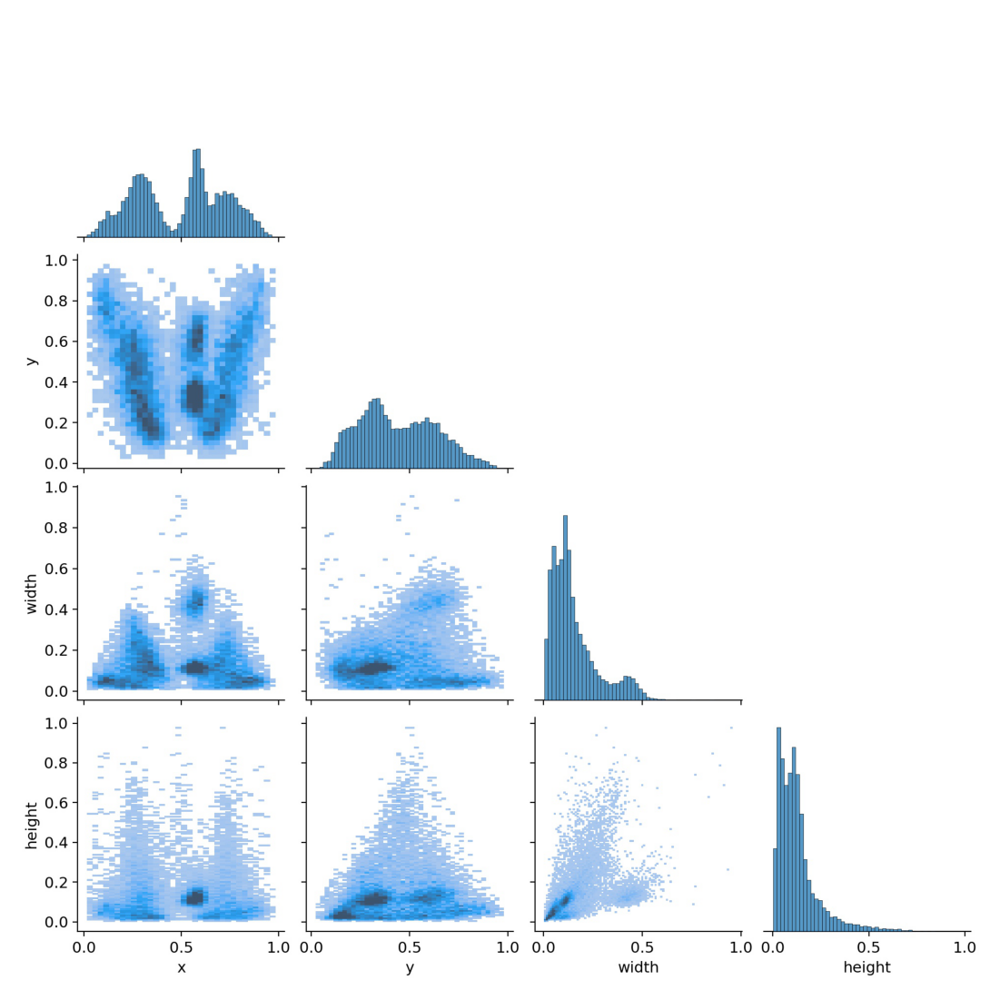

In [30]:
plt.figure(figsize = (20,20))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/labels_correlogram.jpg'));

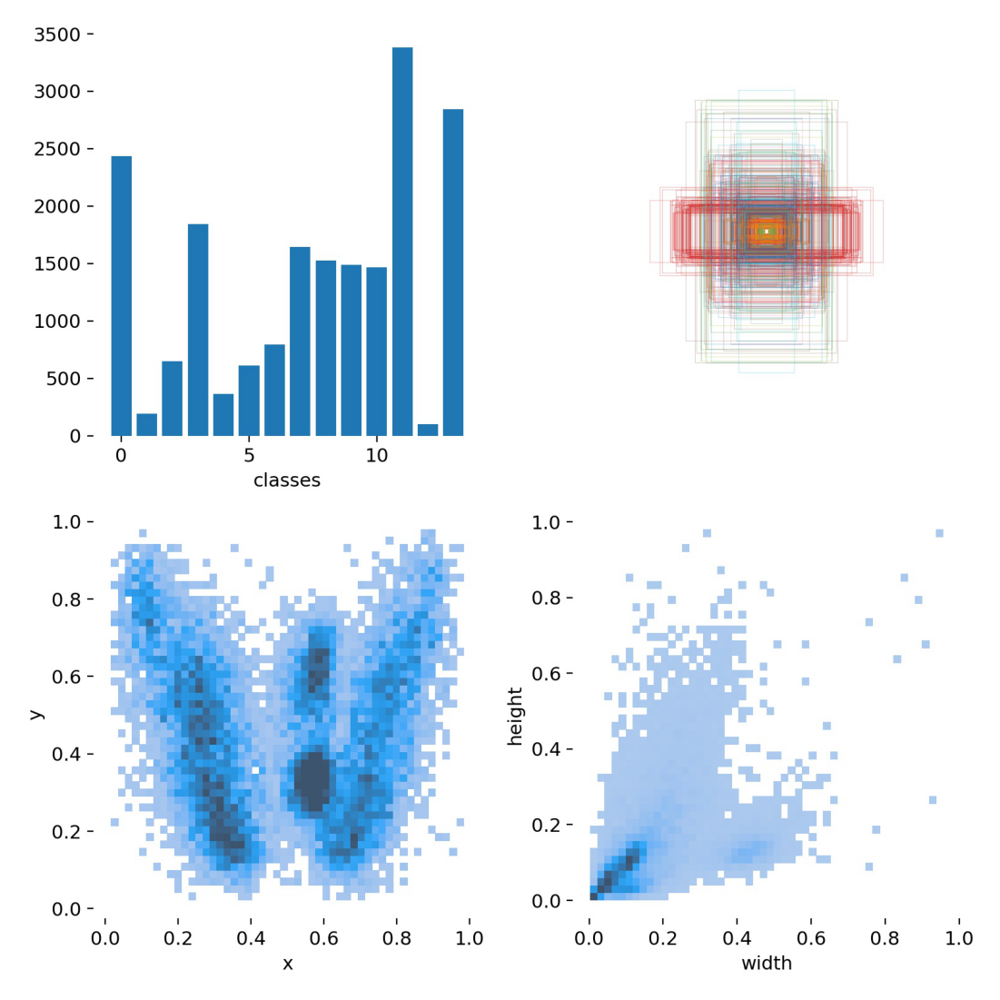

In [31]:
plt.figure(figsize = (20,20))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/labels.jpg'));

# Batch Image

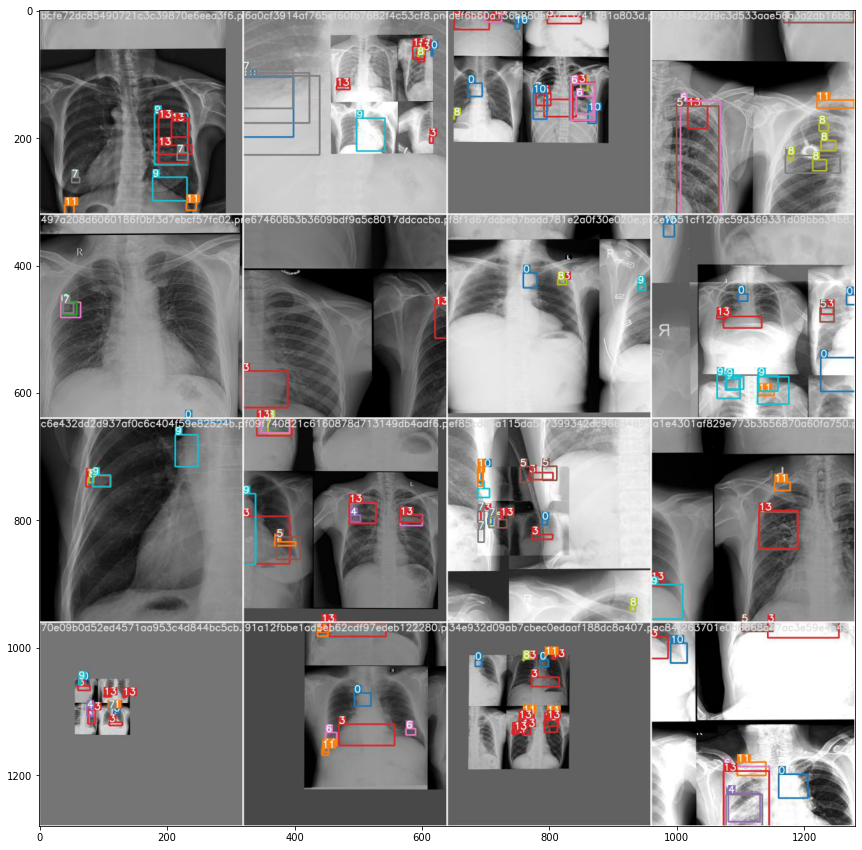

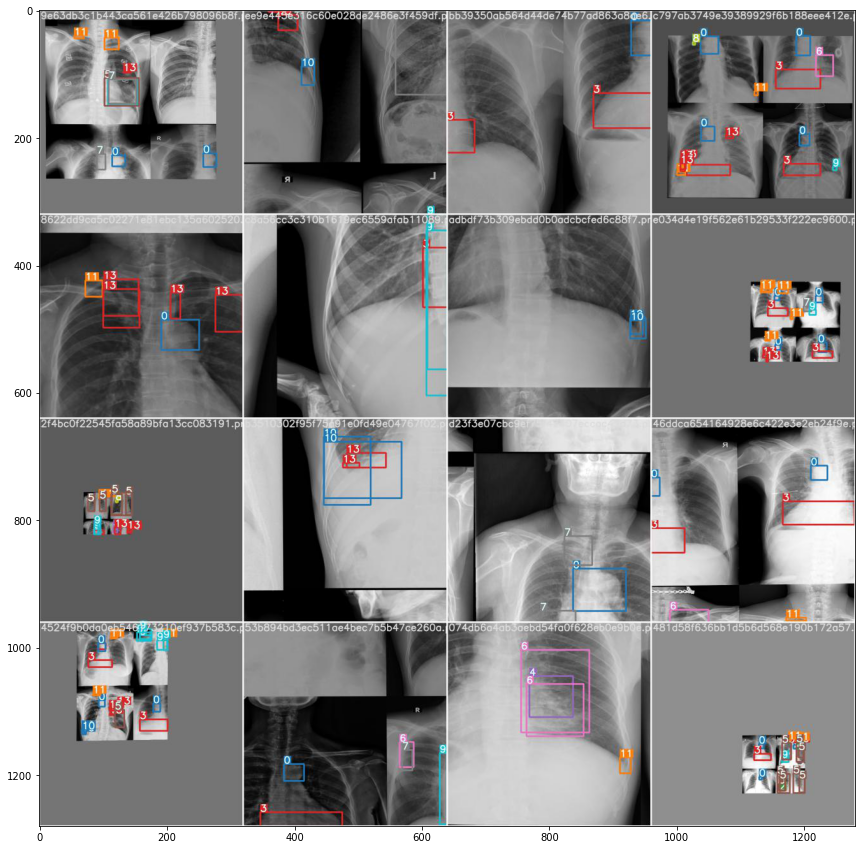

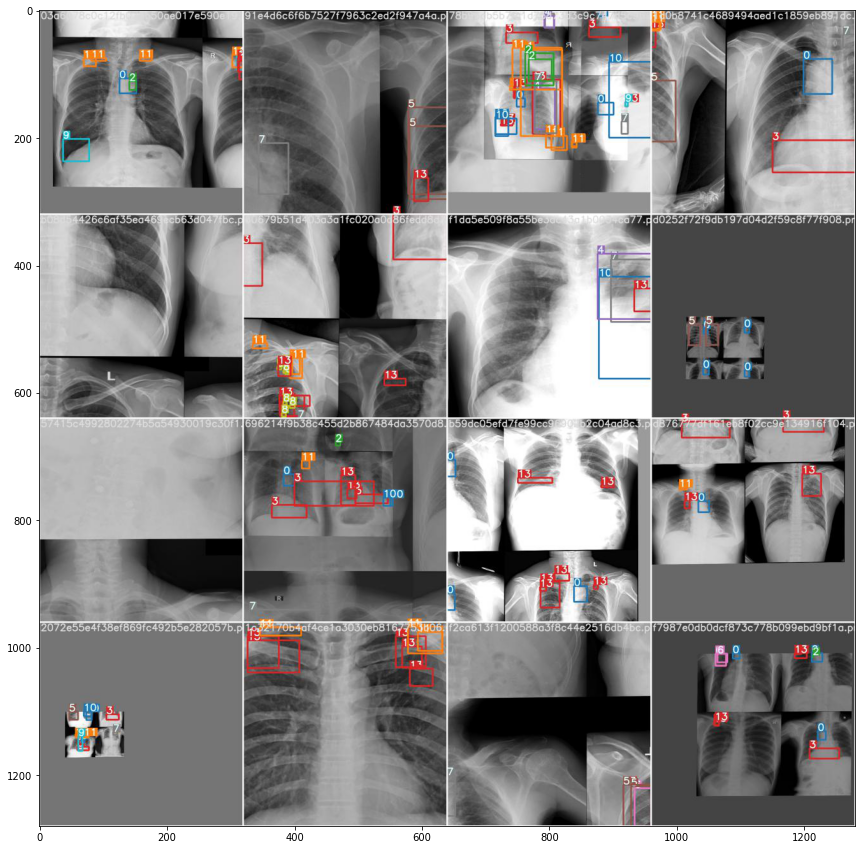

In [32]:
import matplotlib.pyplot as plt
plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/exp/train_batch0.jpg'))

plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/exp/train_batch1.jpg'))

plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/exp/train_batch2.jpg'))

# GT Vs Pred

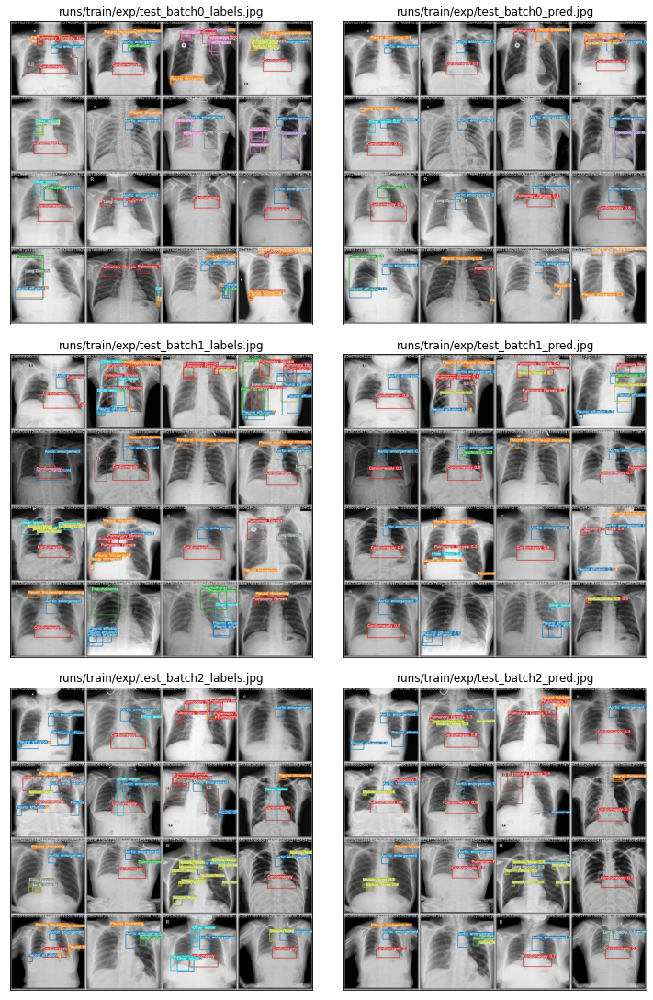

In [33]:
fig, ax = plt.subplots(3, 2, figsize = (2*5,3*5), constrained_layout = True)
for row in range(3):
    ax[row][0].imshow(plt.imread(f'runs/train/exp/test_batch{row}_labels.jpg'))
    ax[row][0].set_xticks([])
    ax[row][0].set_yticks([])
    ax[row][0].set_title(f'runs/train/exp/test_batch{row}_labels.jpg', fontsize = 12)
    
    ax[row][1].imshow(plt.imread(f'runs/train/exp/test_batch{row}_pred.jpg'))
    ax[row][1].set_xticks([])
    ax[row][1].set_yticks([])
    ax[row][1].set_title(f'runs/train/exp/test_batch{row}_pred.jpg', fontsize = 12)

# (Loss, Map) Vs Epoch

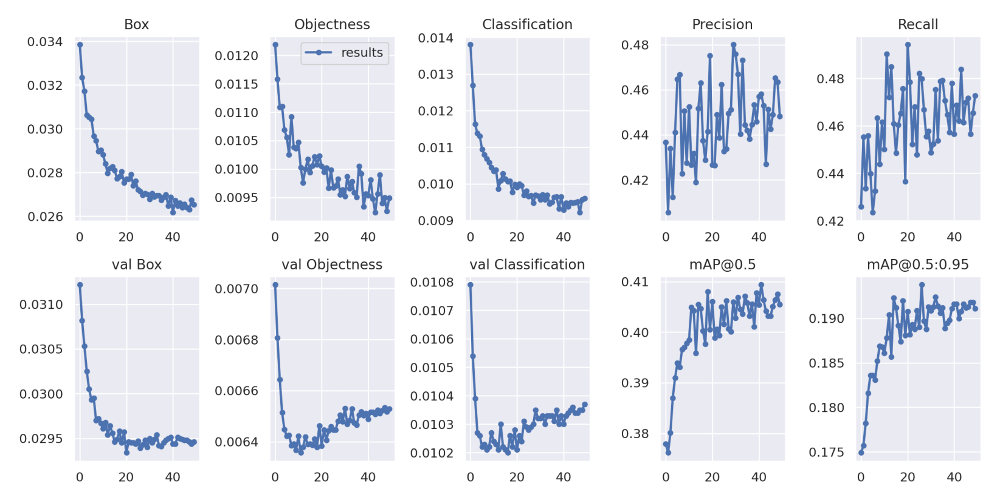

In [34]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/results.png'));

# Precision-Recall Curve

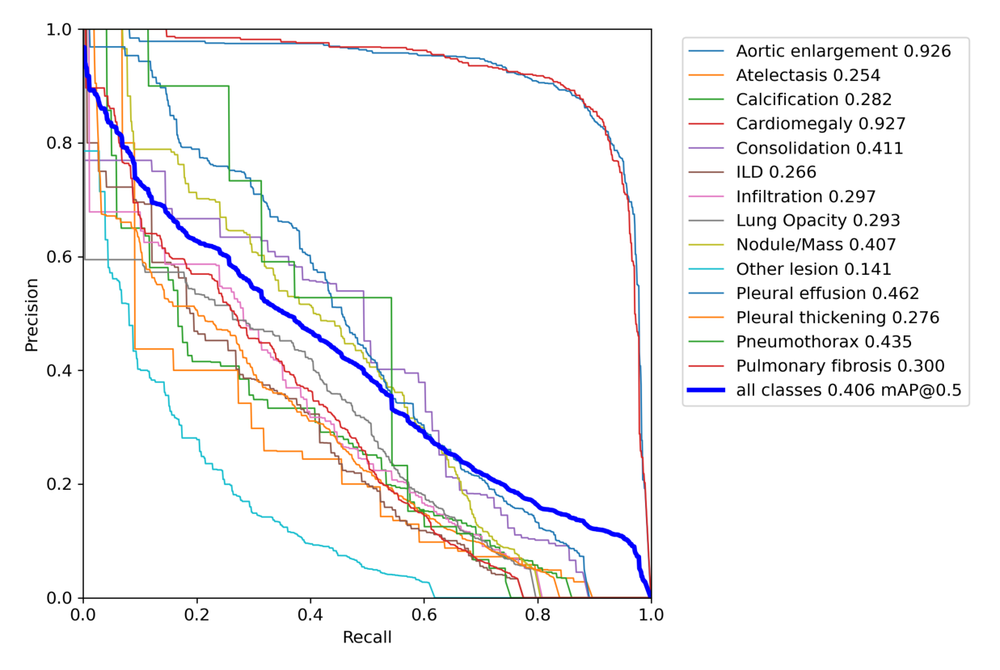

In [35]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/PR_curve.png'));

# F1 Curve

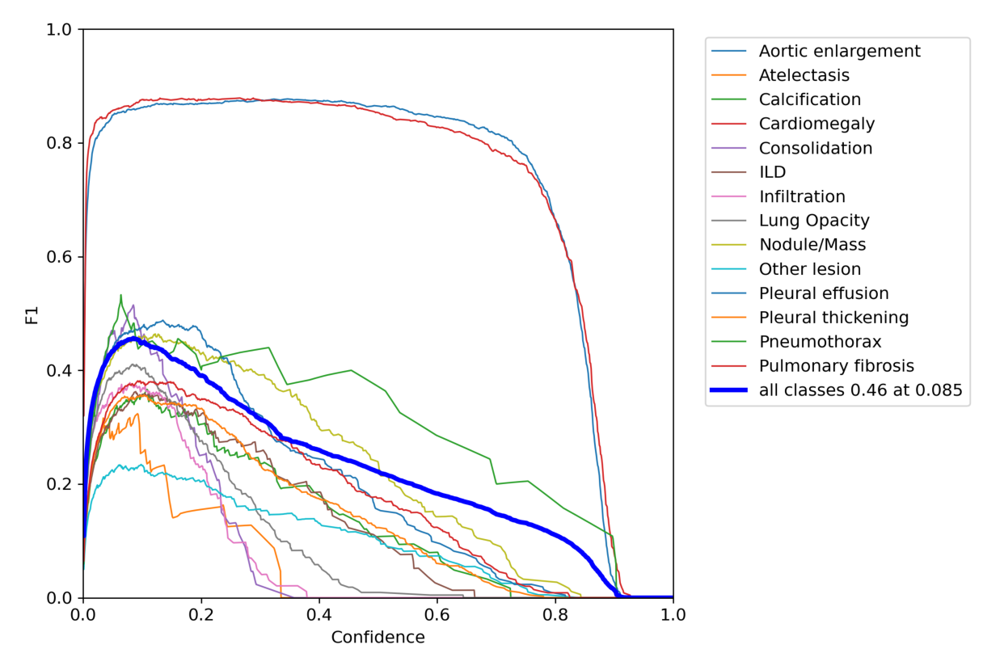

In [36]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/F1_curve.png'));

# Confusion Matrix

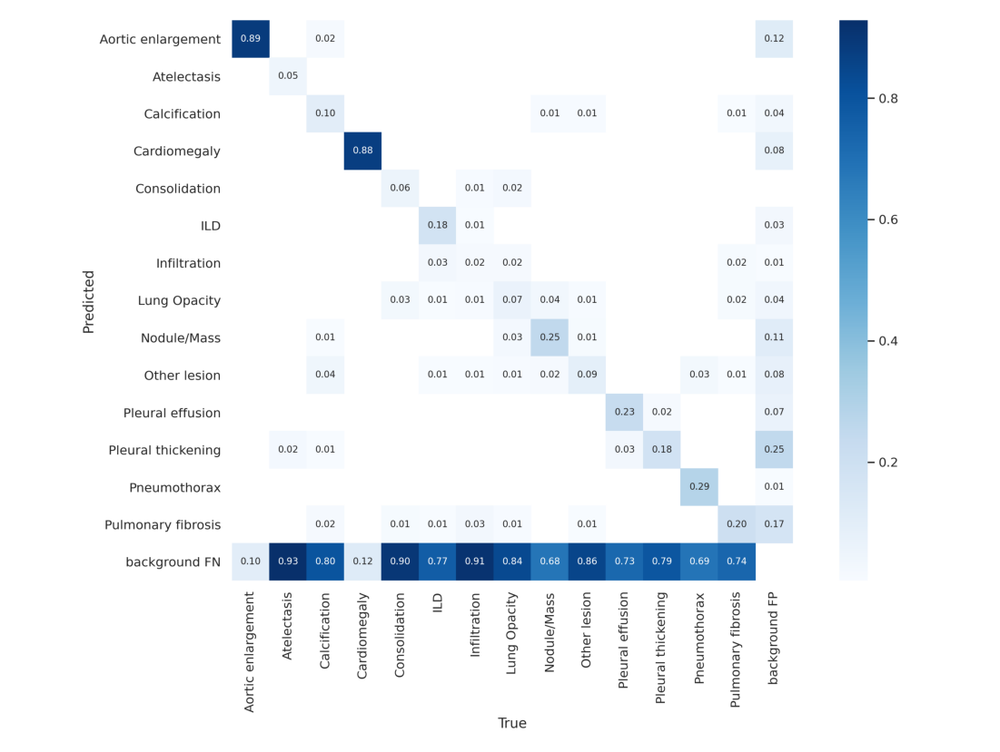

In [37]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/confusion_matrix.png'));

# Inference

In [38]:
!python detect.py --weights 'runs/train/exp/weights/best.pt'\
--img 1024\
--conf 0.15\
--iou 0.5\
--source /root/working/vinbigdata/images/val\
--exist-ok

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.15, device='', exist_ok=True, img_size=1024, iou_thres=0.5, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='/root/working/vinbigdata/images/val', update=False, view_img=False, weights=['runs/train/exp/weights/best.pt'])
YOLOv5  torch 1.7.0+cu110 CUDA:0 (GeForce RTX 3090, 24268.3125MB)
                          CUDA:1 (GeForce RTX 3090, 24268.3125MB)

Fusing layers... 
Model Summary: 476 layers, 87286171 parameters, 0 gradients, 217.4 GFLOPS
image 1/878 /root/working/vinbigdata/images/val/0007d316f756b3fa0baea2ff514ce945.png: 1024x1024 3 ILDs, 1 Pleural thickening, 1 Pulmonary fibrosis, Done. (0.031s)
image 2/878 /root/working/vinbigdata/images/val/000d68e42b71d3eac10ccc077aba07c1.png: 1024x1024 1 Aortic enlargement, 1 ILD, 4 Other lesions, Done. (0.031s)
image 3/878 /root/working/vinbigdata/images/val/0108949daa13dc94634a7d650a05c0bb.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, 1

image 50/878 /root/working/vinbigdata/images/val/0d94045f9e16f077bc6bbdea9f6c561b.png: 1024x1024 1 Calcification, 1 Cardiomegaly, Done. (0.030s)
image 51/878 /root/working/vinbigdata/images/val/0e21abbef40e569be72ab0ad90544f87.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, 1 Pleural effusion, 1 Pneumothorax, Done. (0.030s)
image 52/878 /root/working/vinbigdata/images/val/0e5734a5483002be04b734d7c88058be.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, Done. (0.030s)
image 53/878 /root/working/vinbigdata/images/val/0e8b19dc3af06aaed4718cd664a896bf.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, Done. (0.030s)
image 54/878 /root/working/vinbigdata/images/val/0e91263f0b1925ff01d5ebde3ce65e1a.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, Done. (0.030s)
image 55/878 /root/working/vinbigdata/images/val/0eac4cf8618d5e582c336217d0291f25.png: 1024x1024 1 ILD, Done. (0.030s)
image 56/878 /root/working/vinbigdata/images/val/0f1eba57237922d0f9ec0dee62793435.png: 1024x1024 1 A

image 102/878 /root/working/vinbigdata/images/val/1e584da1fcf0c0297a22f0e36ce86732.png: 1024x1024 1 Aortic enlargement, 2 Nodule/Masss, Done. (0.030s)
image 103/878 /root/working/vinbigdata/images/val/1f5a95707791ca66198f87bf0d11e89e.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, 1 Lung Opacity, 1 Other lesion, 4 Pulmonary fibrosiss, Done. (0.030s)
image 104/878 /root/working/vinbigdata/images/val/1fec989e95cea875cef982129f8e9097.png: 1024x1024 1 Aortic enlargement, 1 Nodule/Mass, 1 Pleural thickening, 1 Pulmonary fibrosis, Done. (0.030s)
image 105/878 /root/working/vinbigdata/images/val/206f64789c8237b16ef4da5a38d74cdc.png: 1024x1024 1 Aortic enlargement, 1 Other lesion, 1 Pleural thickening, Done. (0.030s)
image 106/878 /root/working/vinbigdata/images/val/20d9e4989fab7ecae4243324d81ad309.png: 1024x1024 Done. (0.029s)
image 107/878 /root/working/vinbigdata/images/val/2116aa83dd20261a1c6f4b13ea3eafbc.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, 1 Lung Opacity, Done. (0.03

image 153/878 /root/working/vinbigdata/images/val/30732ad387fb4f2429a6c5b965910869.png: 1024x1024 1 Pulmonary fibrosis, Done. (0.030s)
image 154/878 /root/working/vinbigdata/images/val/30d01b42c2a0495ceea5873455e4c4e4.png: 1024x1024 Done. (0.029s)
image 155/878 /root/working/vinbigdata/images/val/30d70dcb9b7a5d7e9028326954feaa35.png: 1024x1024 3 Pulmonary fibrosiss, Done. (0.030s)
image 156/878 /root/working/vinbigdata/images/val/3105bf6d00f6c2164ea9285b20692df5.png: 1024x1024 2 Pleural thickenings, 2 Pulmonary fibrosiss, Done. (0.030s)
image 157/878 /root/working/vinbigdata/images/val/3115c1b6368f91b45f691edbd63f1a78.png: 1024x1024 1 Cardiomegaly, 2 Pleural effusions, Done. (0.030s)
image 158/878 /root/working/vinbigdata/images/val/3116e8acc9b97d7a581ea891ae9bed80.png: 1024x1024 1 Aortic enlargement, 1 Calcification, 1 Cardiomegaly, 1 Pleural thickening, Done. (0.030s)
image 159/878 /root/working/vinbigdata/images/val/3145bee8f1346fa89938289eedd7b05c.png: 1024x1024 1 Aortic enlargemen

image 203/878 /root/working/vinbigdata/images/val/3b8e32e6bb1f8849af9fde0925b2761a.png: 1024x1024 1 Aortic enlargement, 3 Calcifications, 1 Cardiomegaly, 1 Infiltration, 1 Pleural thickening, Done. (0.030s)
image 204/878 /root/working/vinbigdata/images/val/3c3050b54b5ffefafd7d144497cf04d4.png: 1024x1024 Done. (0.029s)
image 205/878 /root/working/vinbigdata/images/val/3c4b09bd2eab548d9f86223ccb905deb.png: 1024x1024 1 Aortic enlargement, 1 Pleural thickening, 2 Pulmonary fibrosiss, Done. (0.030s)
image 206/878 /root/working/vinbigdata/images/val/3c5e999bcc6ac19f375f201c27546de1.png: 1024x1024 1 ILD, Done. (0.030s)
image 207/878 /root/working/vinbigdata/images/val/3d6be0fd234f4be9a57ea0ec00d1e6b6.png: 1024x1024 1 Cardiomegaly, 1 Infiltration, 2 Pulmonary fibrosiss, Done. (0.030s)
image 208/878 /root/working/vinbigdata/images/val/3ddd8b00908543e9d8a60f528452e59d.png: 1024x1024 1 Aortic enlargement, 2 Calcifications, 1 Cardiomegaly, 1 Pleural thickening, 1 Pulmonary fibrosis, Done. (0.030s)

image 254/878 /root/working/vinbigdata/images/val/4d911f55a3576833aa411f5718c8021e.png: 1024x1024 1 Aortic enlargement, 1 Nodule/Mass, 2 Pleural thickenings, 2 Pulmonary fibrosiss, Done. (0.030s)
image 255/878 /root/working/vinbigdata/images/val/4db77a5ffb5fa45be829a1cb9f6bc281.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, Done. (0.030s)
image 256/878 /root/working/vinbigdata/images/val/4dc920678507b8b1f441b541c5f7d8a6.png: 1024x1024 1 Aortic enlargement, Done. (0.030s)
image 257/878 /root/working/vinbigdata/images/val/4e39db9ee3a3fa04e219e4649581708a.png: 1024x1024 1 Aortic enlargement, 1 Calcification, 1 Infiltration, 1 Lung Opacity, 2 Pleural thickenings, 1 Pulmonary fibrosis, Done. (0.030s)
image 258/878 /root/working/vinbigdata/images/val/4e3a3b03cf00a9060ac139f57843a241.png: 1024x1024 1 Aortic enlargement, 1 Lung Opacity, Done. (0.030s)
image 259/878 /root/working/vinbigdata/images/val/4ec0857964d6c66165927a14b9b7f26f.png: 1024x1024 1 Aortic enlargement, 1 Lung Opacity, 1 

image 302/878 /root/working/vinbigdata/images/val/5879d22d9f6aec0ba5d682bcc6131e22.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, 2 Lung Opacitys, 22 Nodule/Masss, 1 Pleural effusion, Done. (0.031s)
image 303/878 /root/working/vinbigdata/images/val/58ce2d9435ef94fcf6fe4eeda8387890.png: 1024x1024 2 Infiltrations, 1 Pulmonary fibrosis, Done. (0.031s)
image 304/878 /root/working/vinbigdata/images/val/59615049fbc2df4b0aaeb3aca6648421.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, Done. (0.031s)
image 305/878 /root/working/vinbigdata/images/val/59a7447696c775e5330241645060ad1c.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, Done. (0.031s)
image 306/878 /root/working/vinbigdata/images/val/59b1dc77610f1c18cf6524b476128321.png: 1024x1024 1 Aortic enlargement, 1 ILD, 1 Lung Opacity, 1 Nodule/Mass, 2 Pleural thickenings, 1 Pulmonary fibrosis, Done. (0.031s)
image 307/878 /root/working/vinbigdata/images/val/59d215990b0e15b66e129d47f1b34943.png: 1024x1024 2 Aortic enlargements, 2 

image 352/878 /root/working/vinbigdata/images/val/6900482a91a538ead56b483f77bcf289.png: 1024x1024 1 Aortic enlargement, 1 Pleural effusion, Done. (0.030s)
image 353/878 /root/working/vinbigdata/images/val/690a74b4ebf969fbadc5ad0a1187968d.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, 2 ILDs, 1 Nodule/Mass, 1 Pleural thickening, Done. (0.030s)
image 354/878 /root/working/vinbigdata/images/val/69972b49aac9f4aea137e51984cf8691.png: 1024x1024 1 Cardiomegaly, 1 Nodule/Mass, Done. (0.030s)
image 355/878 /root/working/vinbigdata/images/val/6a226af290752e9d60405e5a5a18e90f.png: 1024x1024 1 Aortic enlargement, 2 Nodule/Masss, Done. (0.030s)
image 356/878 /root/working/vinbigdata/images/val/6a29cfd596229d4ac24ad8cbaa103c11.png: 1024x1024 2 Aortic enlargements, 3 Calcifications, 2 Pleural thickenings, Done. (0.030s)
image 357/878 /root/working/vinbigdata/images/val/6a6d716b650b15a1babbcd82ca95d76e.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, Done. (0.030s)
image 358/878 /root/workin

image 403/878 /root/working/vinbigdata/images/val/778592c49dc5b2bd4f4d4f415e174b5c.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, Done. (0.030s)
image 404/878 /root/working/vinbigdata/images/val/78076acd1cd80e71ff62d4fb58f047bc.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, Done. (0.030s)
image 405/878 /root/working/vinbigdata/images/val/78ac03ab2cd9f2e9c7b081761f44f665.png: 1024x1024 Done. (0.029s)
image 406/878 /root/working/vinbigdata/images/val/7959604f5c1f6b274a0da891bc47aad8.png: 1024x1024 Done. (0.029s)
image 407/878 /root/working/vinbigdata/images/val/7978725e43f1b301551e0fdbc32faef5.png: 1024x1024 1 Aortic enlargement, 1 Calcification, 1 Nodule/Mass, 1 Pleural thickening, Done. (0.030s)
image 408/878 /root/working/vinbigdata/images/val/79af351d135ae05867a85d509082f530.png: 1024x1024 1 Cardiomegaly, Done. (0.030s)
image 409/878 /root/working/vinbigdata/images/val/79bd8310bd57dfd23d33bfe5b3cc81d3.png: 1024x1024 1 Cardiomegaly, Done. (0.030s)
image 410/878 /root/worki

image 453/878 /root/working/vinbigdata/images/val/86dbe6128679f9c5752c1c82d040caa2.png: 1024x1024 1 Aortic enlargement, 1 Calcification, 1 Cardiomegaly, Done. (0.030s)
image 454/878 /root/working/vinbigdata/images/val/87222168e0c854adc8d38ecf9715361f.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, Done. (0.030s)
image 455/878 /root/working/vinbigdata/images/val/87686c267f1534a0b3107cbf62b15222.png: 1024x1024 2 Calcifications, 1 Nodule/Mass, 2 Pleural effusions, 1 Pleural thickening, 1 Pulmonary fibrosis, Done. (0.030s)
image 456/878 /root/working/vinbigdata/images/val/87a724e9ba23be348dbaf24878afa014.png: 1024x1024 1 Aortic enlargement, Done. (0.030s)
image 457/878 /root/working/vinbigdata/images/val/87a8df2f22475c7200ebe891d0f25b88.png: 1024x1024 1 Aortic enlargement, 2 Calcifications, 1 Cardiomegaly, 1 ILD, 1 Pleural effusion, Done. (0.030s)
image 458/878 /root/working/vinbigdata/images/val/8833a7356f60fd760f6647555a4d8264.png: 1024x1024 Done. (0.029s)
image 459/878 /root/workin

image 502/878 /root/working/vinbigdata/images/val/945ebd66ed6b631a05e638ff88708e2f.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, Done. (0.030s)
image 503/878 /root/working/vinbigdata/images/val/95421a7356eac56ffcd4eda6ce23cfd4.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, 1 ILD, 1 Pleural thickening, Done. (0.030s)
image 504/878 /root/working/vinbigdata/images/val/9548c30d5cd9f5051877d7070e1dc33c.png: 1024x1024 2 ILDs, 2 Pleural thickenings, 1 Pulmonary fibrosis, Done. (0.030s)
image 505/878 /root/working/vinbigdata/images/val/9598f874069cca35ff56d54925d35ccb.png: 1024x1024 1 Aortic enlargement, 2 Calcifications, 1 Lung Opacity, 1 Nodule/Mass, 1 Pleural thickening, Done. (0.030s)
image 506/878 /root/working/vinbigdata/images/val/959e5d96df8e3eaa7eed10f8b0b3d08c.png: 1024x1024 1 Aortic enlargement, 1 Pleural effusion, 2 Pleural thickenings, Done. (0.031s)
image 507/878 /root/working/vinbigdata/images/val/95b9b32e68bfb95100cc300664f9aae5.png: 1024x1024 1 Aortic enlargement,

image 551/878 /root/working/vinbigdata/images/val/a2c6dd0cabc2fc70fbb1cf2dac50d11c.png: 1024x1024 1 Aortic enlargement, 1 ILD, 3 Nodule/Masss, 1 Pleural effusion, 2 Pleural thickenings, Done. (0.030s)
image 552/878 /root/working/vinbigdata/images/val/a3106645d9ff642b102c1fae08356865.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, 1 Infiltration, 1 Lung Opacity, Done. (0.030s)
image 553/878 /root/working/vinbigdata/images/val/a31fef91832012791b0a749471e37159.png: 1024x1024 1 Aortic enlargement, 1 Nodule/Mass, Done. (0.030s)
image 554/878 /root/working/vinbigdata/images/val/a3942b8f01dd54858add21b966d3986e.png: 1024x1024 1 Aortic enlargement, 1 Calcification, 1 Cardiomegaly, Done. (0.030s)
image 555/878 /root/working/vinbigdata/images/val/a398135fec0dd0d8239d5b6d8d24454b.png: 1024x1024 3 Pleural thickenings, Done. (0.030s)
image 556/878 /root/working/vinbigdata/images/val/a3edf89d922032beef7cf3484ab9fe54.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, 1 Infiltration, 1 Lung Opa

image 600/878 /root/working/vinbigdata/images/val/af274ab115b34a7c0eca41ed997fd214.png: 1024x1024 1 Cardiomegaly, Done. (0.030s)
image 601/878 /root/working/vinbigdata/images/val/af3c3d9f70164856281f8f3444483100.png: 1024x1024 1 Aortic enlargement, 1 Pleural thickening, Done. (0.030s)
image 602/878 /root/working/vinbigdata/images/val/af793b61efb4ac8fba4bc62475506e23.png: 1024x1024 1 Lung Opacity, 1 Nodule/Mass, 1 Pneumothorax, Done. (0.030s)
image 603/878 /root/working/vinbigdata/images/val/af7bc6de796b5a2399c962fead126547.png: 1024x1024 1 Aortic enlargement, Done. (0.030s)
image 604/878 /root/working/vinbigdata/images/val/afb41a2217d37b54f0427fc1c69336be.png: 1024x1024 1 Aortic enlargement, 1 Lung Opacity, 1 Pleural thickening, 1 Pulmonary fibrosis, Done. (0.030s)
image 605/878 /root/working/vinbigdata/images/val/afb8a317a1c70191a4169cf5dd4e1da6.png: 1024x1024 2 Aortic enlargements, 1 Cardiomegaly, Done. (0.030s)
image 606/878 /root/working/vinbigdata/images/val/aff45c4a432e02d85ff83f

image 649/878 /root/working/vinbigdata/images/val/bd24133a5c72fdd62ad820445627b718.png: 1024x1024 1 Aortic enlargement, 1 Calcification, 1 Cardiomegaly, 1 Pulmonary fibrosis, Done. (0.030s)
image 650/878 /root/working/vinbigdata/images/val/bd60f56f346490b1b62e6cfd02cbe7f5.png: 1024x1024 1 Aortic enlargement, 1 Calcification, 6 Nodule/Masss, 1 Other lesion, Done. (0.030s)
image 651/878 /root/working/vinbigdata/images/val/bdaace04fa79a60e8542a3b573288076.png: 1024x1024 2 Calcifications, 4 Nodule/Masss, 2 Pulmonary fibrosiss, Done. (0.030s)
image 652/878 /root/working/vinbigdata/images/val/bdd0bebed953f69413213d387c9717e7.png: 1024x1024 1 Calcification, 3 ILDs, 1 Pleural effusion, 1 Pleural thickening, 1 Pulmonary fibrosis, Done. (0.030s)
image 653/878 /root/working/vinbigdata/images/val/bde7cb2bd708d3d928b6ad9e32038fe1.png: 1024x1024 1 Aortic enlargement, 5 Nodule/Masss, 1 Other lesion, Done. (0.030s)
image 654/878 /root/working/vinbigdata/images/val/be95363066a0f6e2d9644cc14b39d3e1.png:

image 698/878 /root/working/vinbigdata/images/val/cdee8199f2b74923889994f67789dae8.png: 1024x1024 1 Aortic enlargement, 1 Calcification, 1 Cardiomegaly, Done. (0.030s)
image 699/878 /root/working/vinbigdata/images/val/cdfb27f0268e0803530e4511ed89b0c1.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, 1 ILD, Done. (0.030s)
image 700/878 /root/working/vinbigdata/images/val/ce124e4ecf1e643ca350bbc75e7f8658.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, 1 Pleural thickening, Done. (0.030s)
image 701/878 /root/working/vinbigdata/images/val/ce229a03f797a78f5c482af89d78c988.png: 1024x1024 1 Aortic enlargement, 1 Calcification, Done. (0.030s)
image 702/878 /root/working/vinbigdata/images/val/ce4e8ead795a19444e7b9dc1c27cfb66.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, Done. (0.030s)
image 703/878 /root/working/vinbigdata/images/val/ce51a9ef3a4afc873a483972c2264c2f.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, 1 Pleural thickening, 1 Pulmonary fibrosis, Done. (0.030s)
ima

image 747/878 /root/working/vinbigdata/images/val/d94b4e689299d6eb3cc8f5ac772d759b.png: 1024x1024 1 Aortic enlargement, 1 Other lesion, 1 Pleural effusion, Done. (0.030s)
image 748/878 /root/working/vinbigdata/images/val/d9a6b1f6a4175eaee343eef3c1134928.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, Done. (0.030s)
image 749/878 /root/working/vinbigdata/images/val/d9ca6a56d878b6c9f46571e35afb725d.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, Done. (0.030s)
image 750/878 /root/working/vinbigdata/images/val/d9f6c5f7623550374aff527ad8ba6ccd.png: 1024x1024 1 ILD, 3 Pleural effusions, 1 Pleural thickening, Done. (0.030s)
image 751/878 /root/working/vinbigdata/images/val/da1f5d4d40b9a1b9e5c3f4adf092e68c.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, 3 ILDs, Done. (0.030s)
image 752/878 /root/working/vinbigdata/images/val/da648f4e3bf110e8c31b0fd1859c19c2.png: 1024x1024 2 Pulmonary fibrosiss, Done. (0.030s)
image 753/878 /root/working/vinbigdata/images/val/da922b5ee573e770260

image 798/878 /root/working/vinbigdata/images/val/e7c0727f49a3d279143ed21b382ac1c4.png: 1024x1024 1 Aortic enlargement, 3 ILDs, Done. (0.030s)
image 799/878 /root/working/vinbigdata/images/val/e82cedee4afa9651a7bd0d57a23280f2.png: 1024x1024 1 Aortic enlargement, 1 Lung Opacity, 1 Nodule/Mass, 1 Pleural thickening, 1 Pulmonary fibrosis, Done. (0.031s)
image 800/878 /root/working/vinbigdata/images/val/e88010a078a87a4c1cc42cf761e2c72a.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, 3 Pleural thickenings, Done. (0.030s)
image 801/878 /root/working/vinbigdata/images/val/e8e6ff19c3be05a4ccfb20abc4202d52.png: 1024x1024 1 Aortic enlargement, 1 Calcification, 1 Nodule/Mass, 2 Pleural thickenings, 2 Pulmonary fibrosiss, Done. (0.030s)
image 802/878 /root/working/vinbigdata/images/val/e9269d70abec8d90f4790c6afaa4a924.png: 1024x1024 1 Nodule/Mass, 1 Other lesion, Done. (0.030s)
image 803/878 /root/working/vinbigdata/images/val/e9278ee61a8a275650baf02c600c382e.png: 1024x1024 1 Aortic enlargeme

image 847/878 /root/working/vinbigdata/images/val/f51c1a48919f8b36116ed4aa799dcb23.png: 1024x1024 1 Aortic enlargement, 1 Lung Opacity, 2 Nodule/Masss, 1 Pleural effusion, 1 Pulmonary fibrosis, Done. (0.030s)
image 848/878 /root/working/vinbigdata/images/val/f5824499552ae516c70308416344eb91.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, 1 Nodule/Mass, Done. (0.030s)
image 849/878 /root/working/vinbigdata/images/val/f58e50c4d7e818b02f28e52fd6f2a9f2.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, Done. (0.030s)
image 850/878 /root/working/vinbigdata/images/val/f59ccb89d776a68b79292bef810333ac.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, 1 ILD, 5 Nodule/Masss, 1 Pleural thickening, 2 Pulmonary fibrosiss, Done. (0.030s)
image 851/878 /root/working/vinbigdata/images/val/f5e6b0ff23298eff87b65789ee32959e.png: 1024x1024 1 Aortic enlargement, 1 Pleural thickening, Done. (0.030s)
image 852/878 /root/working/vinbigdata/images/val/f62a549cbf9dedb3a5990a691bd7c27a.png: 1024x1024 

# Inference Plot

100%|██████████| 16/16 [00:00<00:00, 50.01it/s]


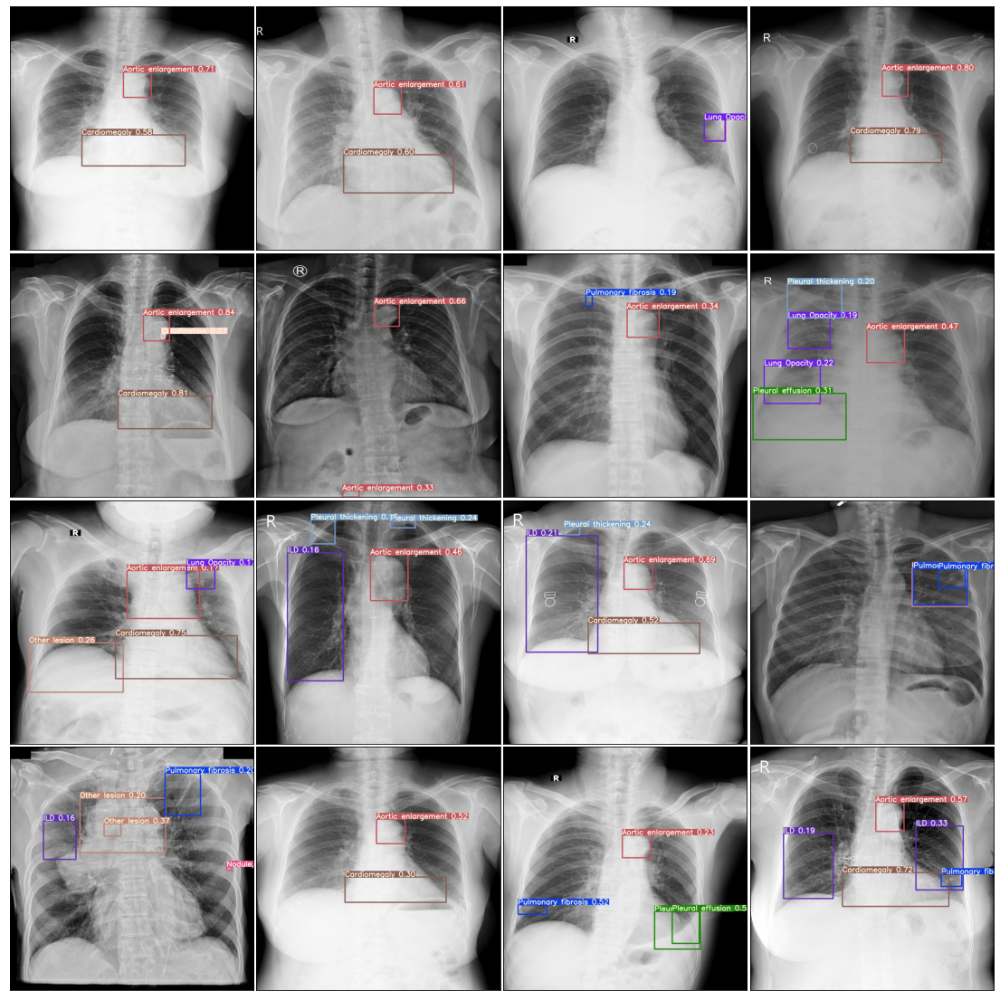

100%|██████████| 16/16 [00:00<00:00, 54.90it/s]


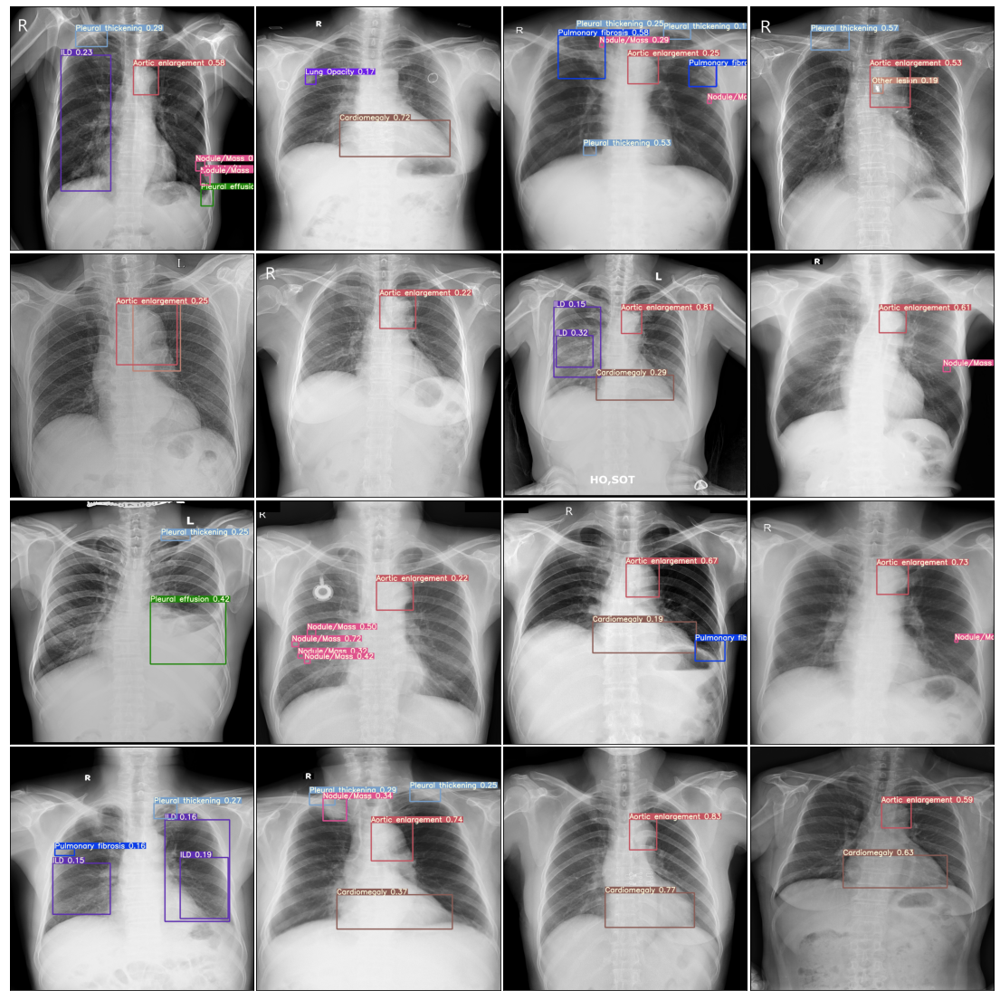

100%|██████████| 16/16 [00:00<00:00, 54.71it/s]


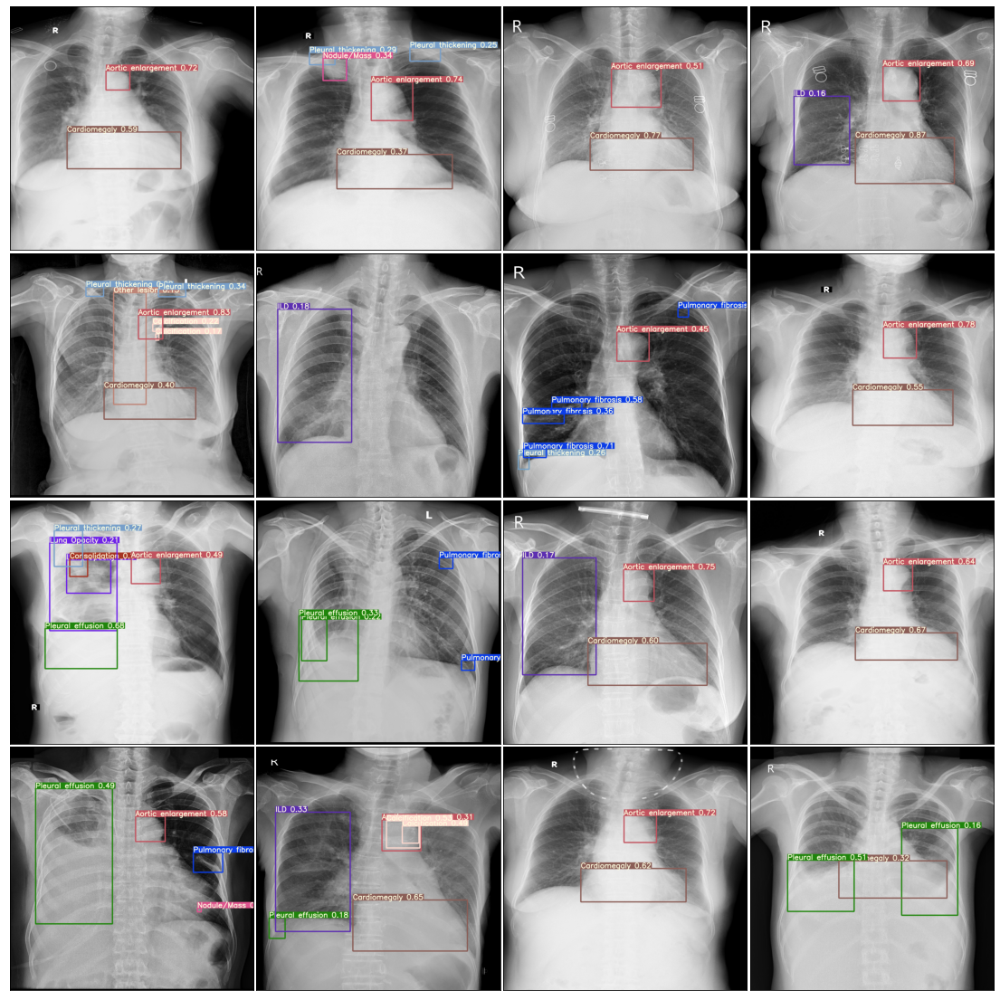

In [39]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np
import random
import cv2
from glob import glob
from tqdm import tqdm

files = glob('runs/detect/exp/*')
for _ in range(3):
    row = 4
    col = 4
    grid_files = random.sample(files, row*col)
    images     = []
    for image_path in tqdm(grid_files):
        img          = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
        images.append(img)

    fig = plt.figure(figsize=(col*5, row*5))
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                     nrows_ncols=(col, row),  # creates 2x2 grid of axes
                     axes_pad=0.05,  # pad between axes in inch.
                     )

    for ax, im in zip(grid, images):
        # Iterating over the grid returns the Axes.
        ax.imshow(im)
        ax.set_xticks([])
        ax.set_yticks([])
    plt.show()

In [ ]:
# shutil.rmtree('/kaggle/working/vinbigdata')
# shutil.rmtree('runs/detect')
# for file in (glob('runs/train/exp/**/*.png', recursive = True)+glob('runs/train/exp/**/*.jpg', recursive = True)):
#     os.remove(file)